In [1]:
include("speciale_tools.jl")
import JLD
import PyPlot



In [2]:

min_vv = -19
max_vv = 4

min_vh = -26
max_vh = -3

min_r = -10
max_r = 1;

min_h = -10
max_h = 100;

In [3]:
data_folder = "/Users/simon/Documents/DTU fag/Speciale/vejle_new/flood"

VV_pre = JLD.load(joinpath(data_folder,"VV_pre_ham.jld"),"data");
VV_co = JLD.load(joinpath(data_folder,"VV_co.jld"),"data");

VH_pre = JLD.load(joinpath(data_folder,"VH_pre_ham.jld"),"data");
VH_co = JLD.load(joinpath(data_folder,"VH_co.jld"),"data");

gamma_pre = JLD.load(joinpath(data_folder,"coherrence_pre.jld"),"data");
gamma_co = JLD.load(joinpath(data_folder,"coherrence_co.jld"),"data");


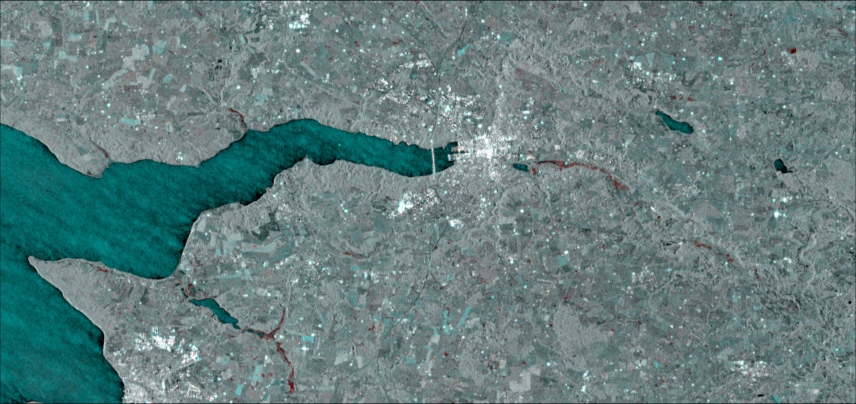

In [4]:
img_VV = pretty_img([VV_co,VV_pre],min_vv,max_vv)
file_path = joinpath(data_folder,"VV_pretty.png")
FileIO.save(file_path,img_VV)
img_VV

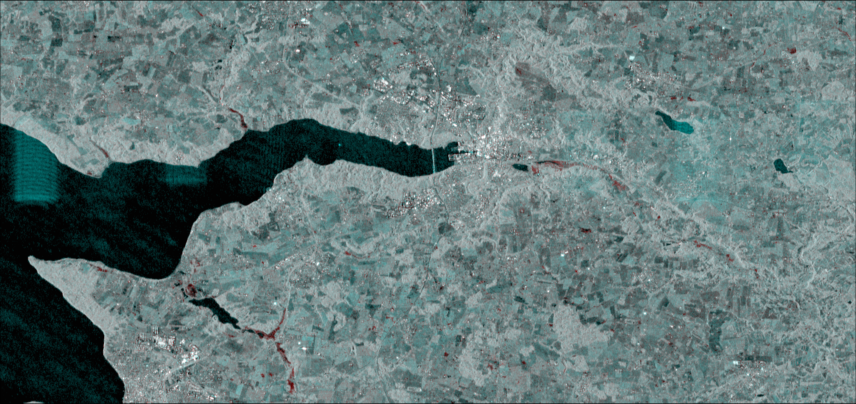

In [5]:
img_VH = pretty_img([VH_co,VH_pre],min_vh,max_vh)
file_path = joinpath(data_folder,"VH_pretty.png")
FileIO.save(file_path,img_VH)
img_VH

In [6]:

water_seed = (10 .*log10.(VV_pre) .< -16) .& (10 .*log10.(VH_pre) .< -27 );

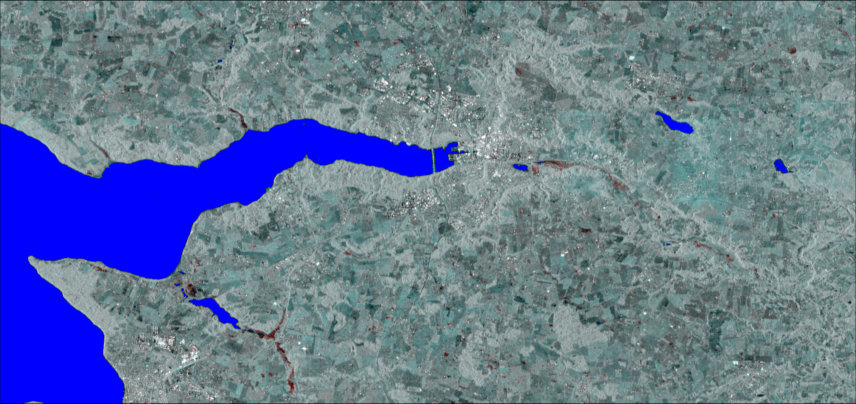

In [7]:
img = add_mask(img_VH,water_seed,[0,0,1])

In [8]:
rg_mask = (10 .*log10.(VV_pre) .< -13) .& (10 .*log10.(VH_pre) .< -24);
ref_water, steps = region_growing(water_seed,rg_mask);

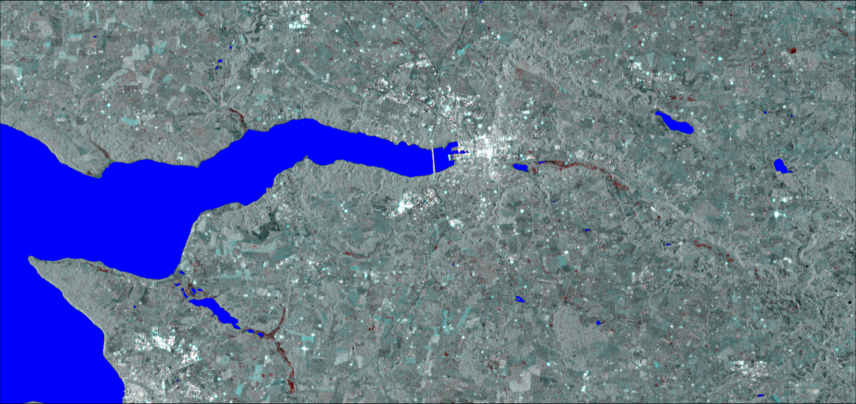

In [9]:
img = add_mask(img_VV,ref_water,[0,0,1])

In [10]:
flood_band = 10 .*log10.(VV_co)
change_band =  flood_band .- 10 .*log10.(VV_pre);

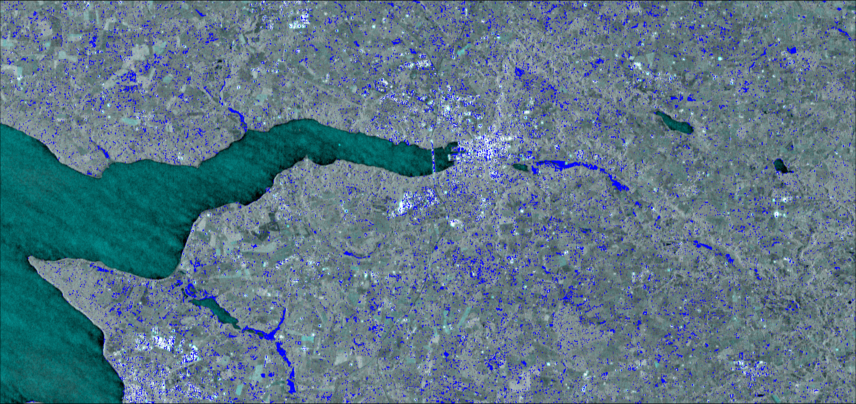

In [11]:
img = add_mask(img_VV,change_band.<0,[0,0,1])

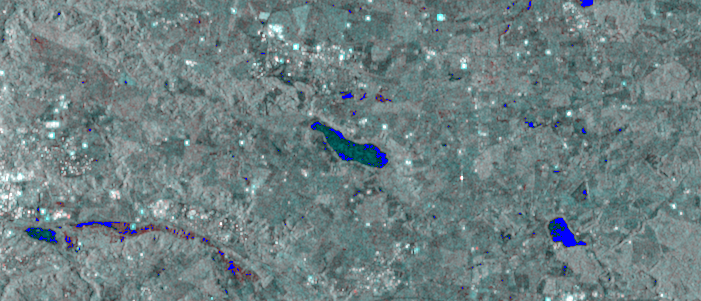

In [12]:
water_seed = flood_band .< -16.5;
rg_mask = (flood_band .< -13) .& (change_band .< -1.5);
img = add_mask(img_VV,water_seed,[0,0,1])[100:400,1000:1700]

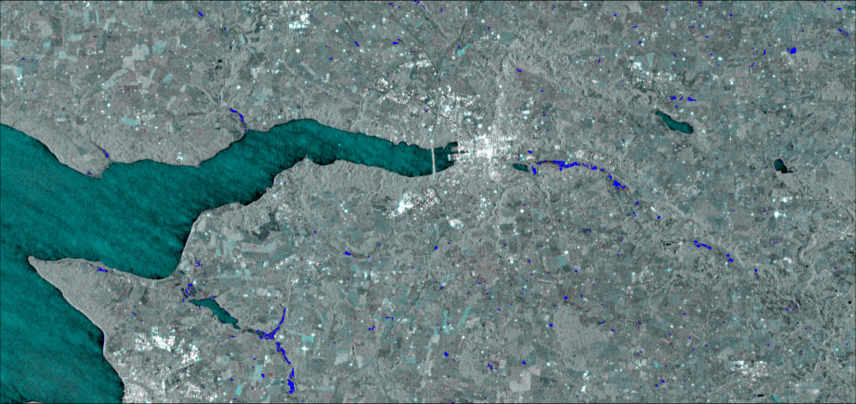

In [13]:
VV_water, steps = region_growing(water_seed,rg_mask);
img = add_mask(img_VV,VV_water,[0,0,1])

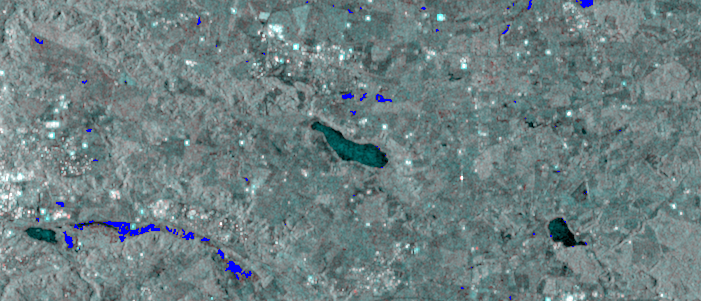

In [14]:
VV_flood = VV_water .& (ref_water .= true)
img = add_mask(img_VV,VV_flood,[0,0,1])[100:400,1000:1700]

## VH

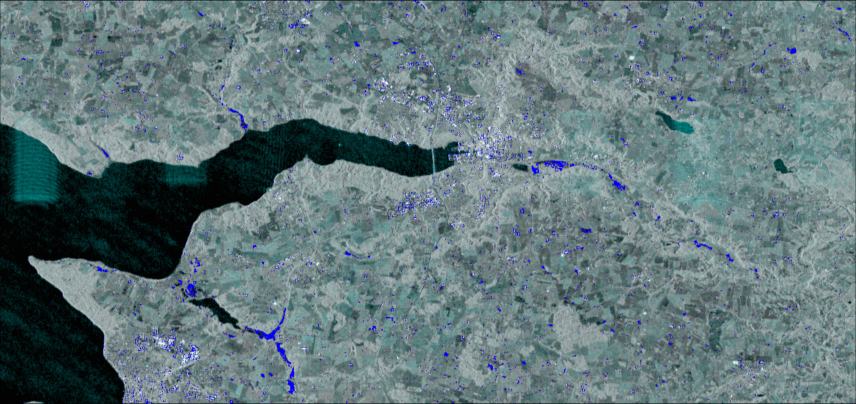

In [15]:
flood_band = 10 .*log10.(VH_co)
change_band =  flood_band .- 10 .*log10.(VH_pre);
img = add_mask(img_VH,change_band.<-1,[0,0,1])

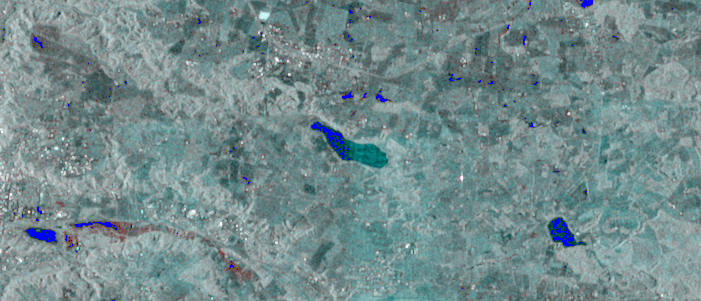

In [16]:
water_seed = flood_band .< -23;
rg_mask = (flood_band .< -21) .& (change_band .< -1);
img = add_mask(img_VH,water_seed,[0,0,1])[100:400,1000:1700]

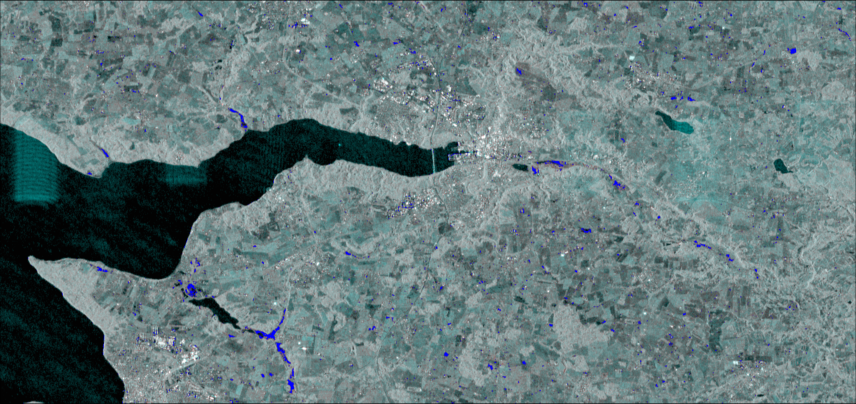

In [17]:
img = add_mask(img_VH,rg_mask,[0,0,1])

In [18]:
VH_water, steps = region_growing(water_seed,rg_mask);
VH_flood = VH_water .& (ref_water .= true);

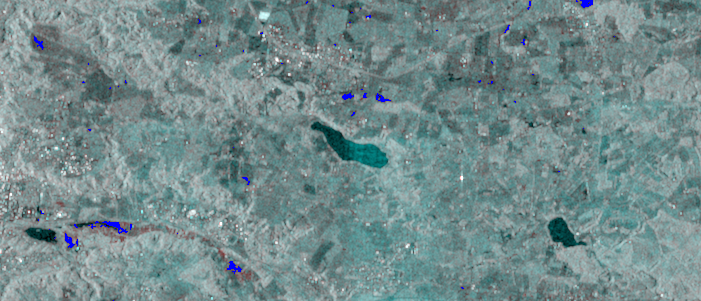

In [19]:
add_mask(img_VH,VH_flood,[0,0,1])[100:400,1000:1700]

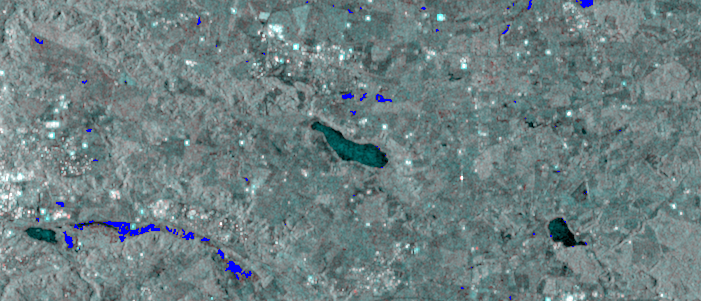

In [20]:
add_mask(img_VV,VV_flood,[0,0,1])[100:400,1000:1700]

In [21]:
kernel = zeros(3,3)
kernel[2,:] .= 1
kernel[:,2] .= 1
VV_morph = skimage_morph.binary_closing(VV_flood ,kernel);
VV_morph = skimage_morph.binary_opening(VV_morph,kernel);

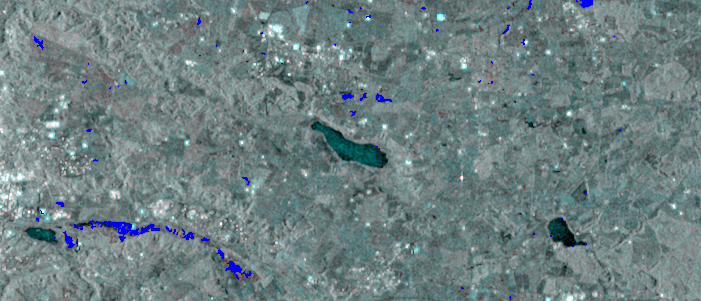

In [22]:
img = add_mask(img_VV,VV_flood.| VH_flood,[0,0,1])[100:400,1000:1700]


In [23]:
kernel = zeros(3,3)
kernel[2,:] .= 1
kernel[:,2] .= 1
kernel = ones(2,2)
flood_combi = skimage_morph.binary_closing(VV_flood.| VH_flood ,kernel);
#flood_combi  = skimage_morph.binary_opening(flood_combi ,kernel);

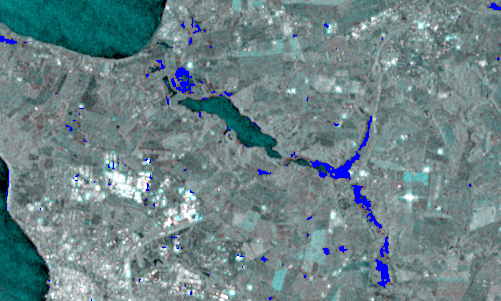

In [24]:
img = add_mask(img_VV,flood_combi,[0,0,1])[500:800,200:700]

In [35]:
geo_lut = JLD.load("/Users/simon/Documents/DTU fag/Speciale/vejle_new/coordinates.jld");
water_contours = find_contours(flood_combi)
close_contours!(water_contours);
water_polygons = contours_to_coordinates_v2(water_contours,geo_lut);
water_polygons = shapely_polygon.(water_polygons);

In [36]:
number = collect(1:length(water_contours));
data_dict = Dict{String,Array}("id_number" => number)

Dict{String,Array} with 1 entry:
  "id_number" => [1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  814, 815, 816, 817, 818, 81…

In [37]:
number_of_pixels = [length(poly_slize(VV_flood,elem)) for elem in water_contours];
data_dict["Pixel_count"] = number_of_pixels;
data_dict["VV_flood"] =[sum(poly_slize(VV_flood,elem)) for elem in water_contours]./number_of_pixels
data_dict["VH_flood"] =[sum(poly_slize(VH_flood,elem)) for elem in water_contours]./number_of_pixels
data_dict["VV_VH_flood"] =[sum(poly_slize(VV_flood .& VH_flood,elem)) for elem in water_contours]./number_of_pixels;
data_dict["Date"] = ["2020-02-17" for elem in water_contours]

tosmall = (data_dict["VV_VH_flood"].<0.2) .&  (data_dict["Pixel_count"] .< 10);
[data_dict[key] = elem[tosmall .!=true] for (key,elem) in data_dict];

In [38]:
data_dict["Polygon"] = water_polygons[tosmall .!=true];
gdf = geopandas_df(data_dict,"Polygon");

In [39]:
save_shape_zip(gdf,"flood_vejle_semi_done",data_folder)

Process(`rm -r '/Users/simon/Documents/DTU fag/Speciale/vejle_new/flood/flood_vejle_semi_done'`, ProcessExited(0))

In [34]:
function contours_to_coordinates_v2(contours,geo_lut)
    contours_coords =  deepcopy(contours)
    
    lat_grid = geo_lut["latitude"]
    lon_grid = geo_lut["longitude"]
    
    for i in 1:length(contours)
        ## contours in line and sample
        index_1 = (contours[i][:,1].-1) 
        index_2 = (contours[i][:,2].-1) 

        contours_coords[i][:,1] = ndimage.map_coordinates(lat_grid,[index_1,index_2],mode="nearest")
        contours_coords[i][:,2] = ndimage.map_coordinates(lon_grid,[index_1,index_2],mode="nearest")
    end
    
    return contours_coords
end

contours_to_coordinates_v2 (generic function with 1 method)